In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

In [2]:
df = pd.read_csv('Fraud_Data.csv', parse_dates = ['signup_time', 'purchase_time'])
ip = pd.read_csv('IpAddress_to_Country.csv')

In [3]:
ip['lower_bound_ip_address'] = ip.lower_bound_ip_address.astype(int)
ip['upper_bound_ip_address'] = ip.upper_bound_ip_address.astype(int)

In [4]:
df['ip_address'] = df.ip_address.astype(int)

In [5]:
df['class'].value_counts()/len(df['class'])

0    0.906354
1    0.093646
Name: class, dtype: float64

In [6]:
df.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,732758368,0
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,350311387,0
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,-2147483648,1
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,-2147483648,0
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,415583117,0


In [7]:
df['delta'] = (df.purchase_time - df.signup_time)
df['delta'] = df.delta/np.timedelta64(1, 's')

In [8]:
df['Heure'] = df['purchase_time'].dt.hour

In [9]:
df['Jour'] = df['purchase_time'].dt.weekday

In [10]:
df['Mois'] = df['purchase_time'].dt.month

ip_data=df.iloc[:,9]

k=[]
for i in range(len(ip_data)):
    ip1=ip_data[i]
    tmp=ip[(ip['lower_bound_ip_address']<=ip1) & (ip['upper_bound_ip_address']>=ip1)]['country'].tolist()
k.extend(tmp if tmp else 'NULL')


In [11]:
def ipp(x):
    try :
        return ip[(ip['lower_bound_ip_address']<=x) & (ip['upper_bound_ip_address']>= x)]['country'].array[0]
    except:
        return np.nan
    

In [12]:
%time df['pays'] = df['ip_address'].apply(ipp)

Wall time: 7min 22s


In [13]:
fraud_pc = pd.DataFrame((df[df['class']==1].groupby(['pays'])['class'].count()/df.groupby(['pays'])['class'].count())*100)

In [14]:
fraud_pc = fraud_pc[~fraud_pc['class'].isna()]
fraud_pc = pd.concat([fraud_pc,pd.DataFrame(df.groupby(['pays'])['class'].count())],axis = 1)
fraud_pc.columns = ['fraud','obs']

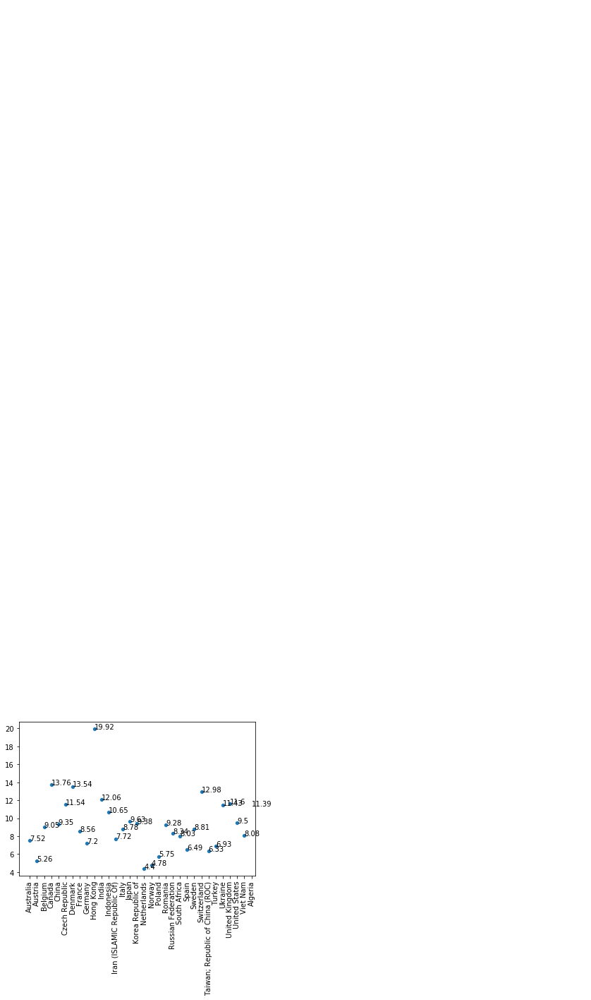

In [15]:
#fig,ax = plt.subplots(figsize = (10,10))
sns.scatterplot(data = fraud_pc['fraud'][fraud_pc.obs > 200])
plt.xticks(rotation = 90)
#plt.ylim([0,50000])
for i in fraud_pc.index:
    plt.annotate(round(fraud_pc['fraud'].loc[i],2),xy = (i,fraud_pc['fraud'].loc[i]))

In [16]:
df = df[df.pays.isin(list(fraud_pc[fraud_pc.obs > 200].sort_values(by = 'fraud', ascending = False).index))]

In [17]:
dummies = pd.get_dummies(df[['source','browser','sex','pays']])

In [18]:
dff = df.drop(columns = ['source','browser','sex','pays','device_id', 'signup_time','user_id','ip_address','purchase_time'])

In [19]:
X = dff.drop(columns = 'class')
Y = dff[['class']]

In [20]:
from sklearn.decomposition import PCA 
pca = PCA(n_components=2)

In [21]:
principalComponents = pca.fit_transform(X)
principalDF = pd.DataFrame(principalComponents)
principalDF.head()

,0,1
0,-4.257439e+05,-2.924107
1,-4.914482e+06,-20.783788
2,-4.932425e+06,-21.746805
3,-4.440341e+06,7.209022
4,-5.709649e+05,2.130438


In [22]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X = sc.fit_transform(X)
X = pd.concat([pd.DataFrame(X,columns = dff.drop(columns = 'class').columns),dummies.reset_index().drop(columns = 'index')], axis = 1)

In [23]:
X

,purchase_value,age,delta,Heure,Jour,Mois,source_Ads,source_Direct,source_SEO,browser_Chrome,...,pays_South Africa,pays_Spain,pays_Sweden,pays_Switzerland,pays_Taiwan; Republic of China (ROC),pays_Turkey,pays_Ukraine,pays_United Kingdom,pays_United States,pays_Viet Nam
0,-0.159571,0.681343,-0.136243,-1.377570,0.990841,-0.755768,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,-1.142318,2.306848,-1.572690,-1.522214,-1.500745,-0.003796,1,0,0,1,...,0,0,0,0,0,0,0,0,1,0
2,-1.196915,2.306848,-1.578432,0.936738,-0.005794,-1.883727,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0.386399,0.913558,-1.420960,0.213517,-1.500745,-0.379782,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0.113414,1.377988,-0.182715,0.936738,-0.504111,1.124163,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145012,0.331802,-0.595840,0.105222,-1.666858,1.489158,-1.131754,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
145013,-0.104974,-0.131409,-1.280415,0.068873,-1.002428,-0.379782,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
145014,0.168011,-0.828055,0.559761,-0.654349,-0.504111,-0.379782,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
145015,0.495593,0.449128,0.068384,-0.365060,-1.500745,1.124163,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [24]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, stratify = Y, random_state = 42)

In [25]:
PC_train, PC_test, Y_train, Y_test = train_test_split(principalDF,Y, test_size = 0.3, stratify = Y, random_state = 42)

# Regression Logistique

In [26]:
from sklearn.linear_model import LogisticRegression

log = LogisticRegression()

log.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\Users\tashi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression()

In [27]:
print(log.score(X_train,Y_train))
print(log.score(X_test,Y_test))

0.9070839613440908
0.9072771571737231


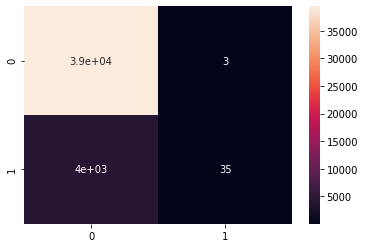

In [28]:
from sklearn import metrics 
y_pred1 = log.predict(X_test)
cm = metrics.confusion_matrix(Y_test, y_pred1)
sns.heatmap(cm, annot=True)

In [29]:
dfpred = pd.DataFrame({'pred':y_pred1,'actual':Y_test['class'].values})
FN = dfpred.pred[(dfpred.actual == 1) & (dfpred.pred == 0)].count()
TP = dfpred.actual[(dfpred.actual == 1) & (dfpred.pred == 1)].count()
FP = dfpred.actual[(dfpred.actual == 0) & (dfpred.pred == 1)].count()
TN = dfpred.actual[(dfpred.actual == 0) & (dfpred.pred == 0)].count()

In [30]:
Accuracy = (TP+TN)/(TP+TN+FP+FN)*100
Recall = TP/(TP+FN)*100
Precision = TP/(TP + FP)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 90.73% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 0.86% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 92.11% (le pourcentage de prediction 1 qui sont correctes)


In [31]:
Y['class'].value_counts()/Y['class'].count()*100

0    90.65351
1     9.34649
Name: class, dtype: float64

# SVM

In [32]:
from sklearn import svm

model = svm.SVC(kernel = 'rbf')

model.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SVC()

In [33]:
model.score(X_test,Y_test)

0.9489035995035168

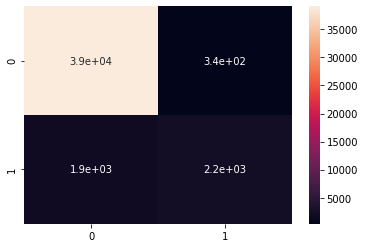

In [34]:
from sklearn import metrics 
y_pred2 = model.predict(X_test)
cm = metrics.confusion_matrix(Y_test, y_pred2)
sns.heatmap(cm, annot=True)

In [35]:
dfpred2 = pd.DataFrame({'pred':y_pred2,'actual':Y_test['class'].values})
FN2 = dfpred2.pred[(dfpred2.actual == 1) & (dfpred2.pred == 0)].count()
TP2 = dfpred2.actual[(dfpred2.actual == 1) & (dfpred2.pred == 1)].count()
FP2 = dfpred2.actual[(dfpred2.actual == 0) & (dfpred2.pred == 1)].count()
TN2 = dfpred2.actual[(dfpred2.actual == 0) & (dfpred2.pred == 0)].count()

In [36]:
Accuracy = (TP2+TN2)/(TP2+TN2+FP2+FN2)*100
Recall = TP2/(TP2+FN2)*100
Precision = TP2/(TP2 + FP2)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 94.89% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.81% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 86.38% (le pourcentage de prediction 1 qui sont correctes)


from sklearn.model_selection import GridSearchCV
param_grid = {'C':[1,5,10,50], 'gamma':[0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model,param_grid, n_jobs = -1, verbose = 2)
%time grid.fit(X_train,Y_train)

print(grid.best_params_)
print(grid.score(X_train,Y_train))
grid.score(X_test,Y_test)

# Decision Tree

In [37]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier(criterion = 'gini')
dtc.fit(X_train,Y_train)

DecisionTreeClassifier()

In [38]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(dtc,out_file=None, feature_names = X.columns)
graph = graphviz.Source(dot_data)
graph

In [39]:
dtc.score(X_test, Y_test)

0.9059669930584288

In [40]:
y_pred3 = dtc.predict(X_test)

In [41]:
dfpred3 = pd.DataFrame({'pred':y_pred3,'actual':Y_test['class'].values})
FN3 = dfpred3.pred[(dfpred3.actual == 1) & (dfpred3.pred == 0)].count()
TP3 = dfpred3.actual[(dfpred3.actual == 1) & (dfpred3.pred == 1)].count()
FP3 = dfpred3.actual[(dfpred3.actual == 0) & (dfpred3.pred == 1)].count()
TN3 = dfpred3.actual[(dfpred3.actual == 0) & (dfpred3.pred == 0)].count()

In [42]:
dfpred3['pred'].value_counts()

0    38923
1     4583
Name: pred, dtype: int64

In [43]:
Accuracy = (TP3+TN3)/(TP3+TN3+FP3+FN3)*100
Recall = TP3/(TP3+FN3)*100
Precision = TP3/(TP3 + FP3)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 90.6% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 56.05% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 49.73% (le pourcentage de prediction 1 qui sont correctes)


## Random Forest

In [44]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators = 1000)

rfc.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """


RandomForestClassifier(n_estimators=1000)

In [45]:
rfc.score(X_test,Y_test)

0.9564427895002988

In [46]:
y_pred4 = rfc.predict(X_test)

In [47]:
dfpred4 = pd.DataFrame({'pred':y_pred4,'actual':Y_test['class'].values})
FN4 = dfpred4.pred[(dfpred4.actual == 1) & (dfpred4.pred == 0)].count()
TP4 = dfpred4.actual[(dfpred4.actual == 1) & (dfpred4.pred == 1)].count()
FP4 = dfpred4.actual[(dfpred4.actual == 0) & (dfpred4.pred == 1)].count()
TN4 = dfpred4.actual[(dfpred4.actual == 0) & (dfpred4.pred == 0)].count()

In [48]:
Accuracy = (TP4+TN4)/(TP4+TN4+FP4+FN4)*100
Recall = TP4/(TP4+FN4)*100
Precision = TP4/(TP4 + FP4)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 95.64% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.39% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 100.0% (le pourcentage de prediction 1 qui sont correctes)


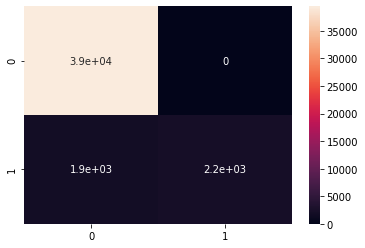

In [49]:
cm = metrics.confusion_matrix(Y_test, y_pred4)
sns.heatmap(cm, annot=True)

from sklearn.model_selection import GridSearchCV
params = {'n_estimators':[1,5,10,100,1000], 'criterion' : ['gini', 'entropy']}

grid = GridSearchCV(rfc, params, n_jobs = -1, verbose = 2)
grid.fit(X_ros, y_ros)

grid.best_params_

## OverSampling RandomOverSampler

In [50]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()
X_ros, y_ros = ros.fit_sample(X_train, Y_train)

print(X_ros.shape[0] - X_train.shape[0], 'new random picked points')

y_ros['class'].value_counts()

82535 new random picked points


1    92023
0    92023
Name: class, dtype: int64

In [51]:
rfc2 = RandomForestClassifier(n_estimators = 100)
rfc2.fit(X_ros,y_ros)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier()

In [52]:
y_pred5 = rfc2.predict(X_test)
dfpred5 = pd.DataFrame({'pred':y_pred5,'actual':Y_test['class'].values})
FN5 = dfpred5.pred[(dfpred5.actual == 1) & (dfpred5.pred == 0)].count()
TP5 = dfpred5.actual[(dfpred5.actual == 1) & (dfpred5.pred == 1)].count()
FP5 = dfpred5.actual[(dfpred5.actual == 0) & (dfpred5.pred == 1)].count()
TN5 = dfpred5.actual[(dfpred5.actual == 0) & (dfpred5.pred == 0)].count()

In [53]:
Accuracy = (TP5+TN5)/(TP5+TN5+FP5+FN5)*100
Recall = TP5/(TP5+FN5)*100
Precision = TP5/(TP5 + FP5)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 95.61% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.42% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 99.18% (le pourcentage de prediction 1 qui sont correctes)


## OverSampling SMOTE

In [54]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority', random_state = 42)
X_sm, Y_sm = smote.fit_sample(PC_train, Y_train)

In [55]:
rfc3 = RandomForestClassifier(n_estimators = 1000)
rfc3.fit(X_sm,Y_sm)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(n_estimators=1000)

In [56]:
y_pred6 = rfc3.predict(PC_test)
dfpred6 = pd.DataFrame({'pred':y_pred6,'actual':Y_test['class'].values})
FN6 = dfpred6.pred[(dfpred6.actual == 1) & (dfpred6.pred == 0)].count()
TP6 = dfpred6.actual[(dfpred6.actual == 1) & (dfpred6.pred == 1)].count()
FP6 = dfpred6.actual[(dfpred6.actual == 0) & (dfpred6.pred == 1)].count()
TN6 = dfpred6.actual[(dfpred6.actual == 0) & (dfpred6.pred == 0)].count()

In [57]:
Accuracy = (TP6+TN6)/(TP6+TN6+FP6+FN6)*100
Recall = TP6/(TP6+FN6)*100
Precision = TP6/(TP6 + FP6)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 91.01% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 55.61% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 51.76% (le pourcentage de prediction 1 qui sont correctes)


## XGBOOST

In [58]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [59]:
from xgboost import XGBClassifier
regressor_xgb = XGBClassifier()
regressor_xgb.fit(X_ros, y_ros)
regressor_xgb.score(X_test, Y_test)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


0.9412264974945984

In [60]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
best = GridSearchCV(XGBClassifier(), params)
best.fit(X_ros, y_ros)

NameError: name 'GridSearchCV' is not defined

In [ ]:
y_pred7 = regressor_xgb.predict(X_test)
dfpred7 = pd.DataFrame({'pred':y_pred7,'actual':Y_test['class'].values})
FN7 = dfpred7.pred[(dfpred7.actual == 1) & (dfpred7.pred == 0)].count()
TP7 = dfpred7.actual[(dfpred7.actual == 1) & (dfpred7.pred == 1)].count()
FP7 = dfpred7.actual[(dfpred7.actual == 0) & (dfpred7.pred == 1)].count()
TN7 = dfpred7.actual[(dfpred7.actual == 0) & (dfpred7.pred == 0)].count()

In [ ]:
Accuracy = (TP7+TN7)/(TP7+TN7+FP7+FN7)*100
Recall = TP7/(TP7+FN7)*100
Precision = TP7/(TP7 + FP7)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

In [ ]:
lis = list(X.columns)

In [ ]:
lis.append('Actual')
lis.append('Pred')

In [ ]:
new = pd.concat([pd.DataFrame(X_test),pd.DataFrame(y_pred7),Y_test['class'].reset_index()], axis = 1, ignore_index = True).drop(columns  = [46])
new.columns = lis

In [ ]:
newf = new[(new.Actual == 1) & (new.Pred ==0)]

### Comparatif

In [64]:
models = [log,model,dtc,rfc,rfc3,regressor_xgb]

for i in models:
    i.fit(X_train,Y_train)
    i.predict(X_test)
    d = pd.DataFrame({'pred':i.predict(X_test),'actual':Y_test['class'].values})
    TP = d.actual[(d.actual == 1) & (d.pred == 1)].count()
    FN = d.actual[(d.actual == 1) & (d.pred == 0)].count()
    Recall = TP/(TP+FN)*100
    print('Le recall du model {} est de {}'.format(i,Recall))
    i.fit(X_ros,y_ros)
    i.predict(X_test)
    d1 = pd.DataFrame({'pred':i.predict(X_test),'actual':Y_test['class'].values})
    TP1 = d1.actual[(d1.actual == 1) & (d1.pred == 1)].count()
    FN1 = d1.actual[(d1.actual == 1) & (d1.pred == 0)].count()
    Recall = TP/(TP+FN)*100
    print('Le recall du model {} OverSampled est de {}'.format(i,Recall))
    i.fit(PC_train,Y_train)
    i.predict(PC_test)
    d2 = pd.DataFrame({'pred':i.predict(PC_test),'actual':Y_test['class'].values})
    TP1 = d2.actual[(d2.actual == 1) & (d2.pred == 1)].count()
    FN1 = d2.actual[(d2.actual == 1) & (d2.pred == 0)].count()
    Recall = TP/(TP+FN)*100
    print('Le recall du model {} PCA est de {}'.format(i,Recall))

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\Users\tashi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example u

Le recall du model LogisticRegression() est de 0.8607968519429415


C:\Users\tashi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Le recall du model LogisticRegression() OverSampled est de 0.8607968519429415
Le recall du model LogisticRegression() PCA est de 0.8607968519429415


C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Le recall du model SVC() est de 53.812100344318736


C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Le recall du model SVC() OverSampled est de 53.812100344318736


C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Le recall du model SVC() PCA est de 53.812100344318736
Le recall du model DecisionTreeClassifier() est de 56.19773733398918
Le recall du model DecisionTreeClassifier() OverSampled est de 56.19773733398918
Le recall du model DecisionTreeClassifier() PCA est de 56.19773733398918


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


Le recall du model RandomForestClassifier(n_estimators=1000) est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  # This is added back by InteractiveShellApp.init_path()


Le recall du model RandomForestClassifier(n_estimators=1000) OverSampled est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Le recall du model RandomForestClassifier(n_estimators=1000) PCA est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


Le recall du model RandomForestClassifier(n_estimators=1000) est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  # This is added back by InteractiveShellApp.init_path()


Le recall du model RandomForestClassifier(n_estimators=1000) OverSampled est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Le recall du model RandomForestClassifier(n_estimators=1000) PCA est de 53.39399901623217


C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


Le recall du model XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None) est de 53.39399901623217
Le recall du model XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
